# Latest 01

In [35]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

In [36]:
def read_files(ddir):
    images = dict()
    ACCEPTED_FORMAT = ['jpg', 'png']
    for d in sorted(os.listdir(ddir)):
        if d.split('.')[1].lower() in ACCEPTED_FORMAT:
            fname = d.split('.')[0]
            print(f'reading {os.path.join(ddir, d)}...')
            images[fname] = cv2.imread(os.path.join(ddir, d))
            images[fname] = cv2.cvtColor(images[fname], cv2.COLOR_BGR2RGB)
    return images

def display_all(imgs, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def display_all_with(imgs, cc, subs=(10,10), fgsz=(15,18), use_gray=True):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k][:,:,cc], cmap='gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def save_plots(imgs, suptitle, savedir, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
    fig.suptitle(suptitle)
    fig.savefig(savedir) 
    

## Main

In [37]:
POSITIVE = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive'
NEGATIVE = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/negative'

In [38]:
pos = read_files(POSITIVE)

reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/036.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/069.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/158.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/159.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/160.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/228.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/229.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/245.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/247.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/273.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/277.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/289.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/293.jpg...
reading /hom

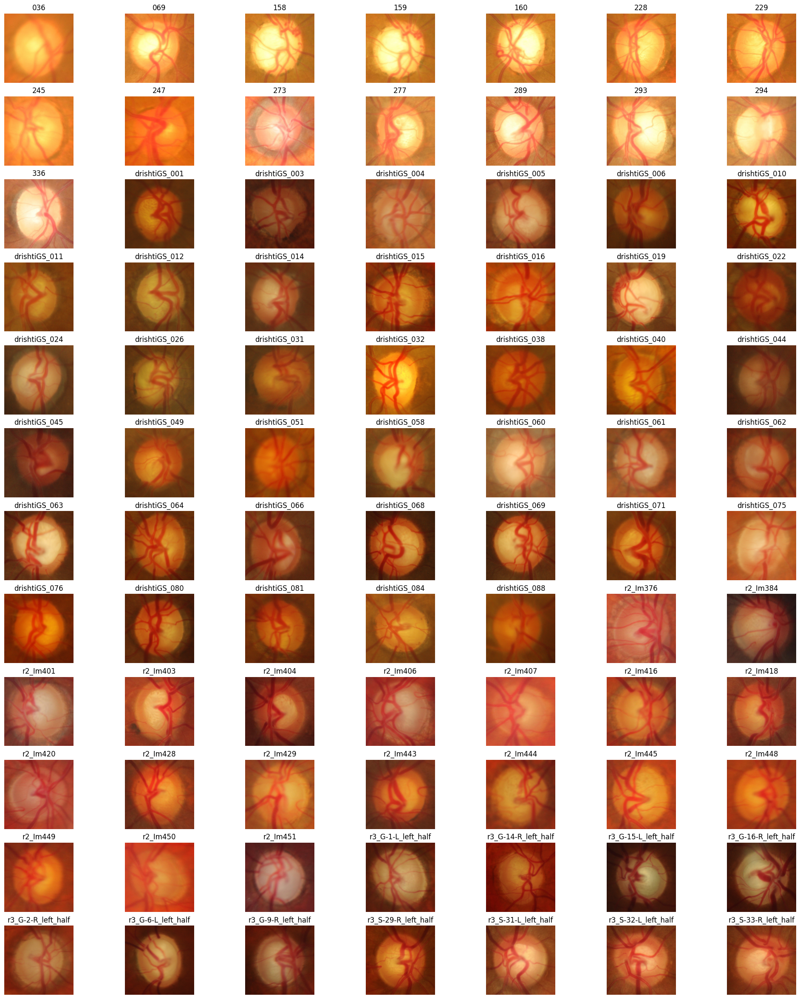

In [39]:
display_all(pos, (12, 7), (25, 30))

In [40]:
def preprocess(imgs):
    p = {} # for development only
    pre = {}
    # sharpen_kernel = np.array([[0, -1, 0],
    #                [-1, 5,-1],
    #                [0, -1, 0]])
    for img in imgs:
        # sharpd = cv2.filter2D(src=imgs[img], ddepth=-1, kernel=sharpen_kernel)
        # pre[img] = cv2.fastNlMeansDenoisingColored(imgs[img],None,10,10,7,21)
        pre[img] = adjust_gamma(imgs[img], 1.5)
        
    # display_all(p, (12,7), (25,30)) # for development only
    return pre

def adjust_gamma(image, gamma=1.0):
    table = np.array([((i / 255.0) ** gamma) * 255
      for i in np.arange(0, 256)]).astype("uint8")

    return cv2.LUT(image, table)


In [41]:
pre = preprocess(pos)

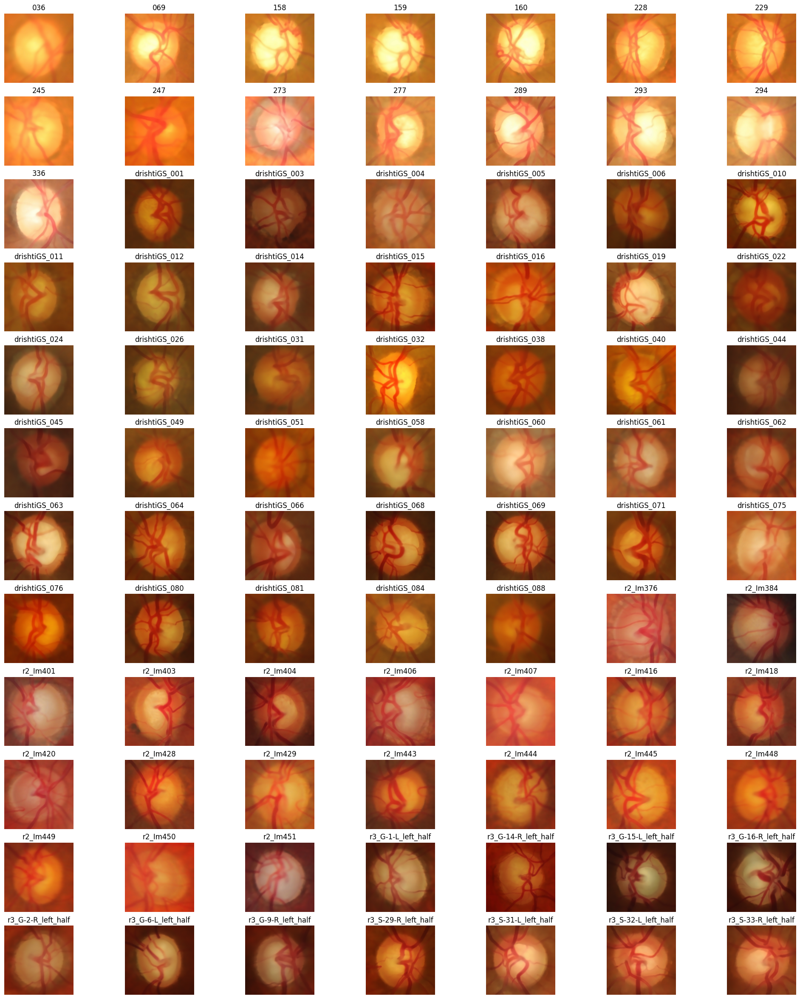

In [42]:
display_all(pre, (12,7), (25,30))

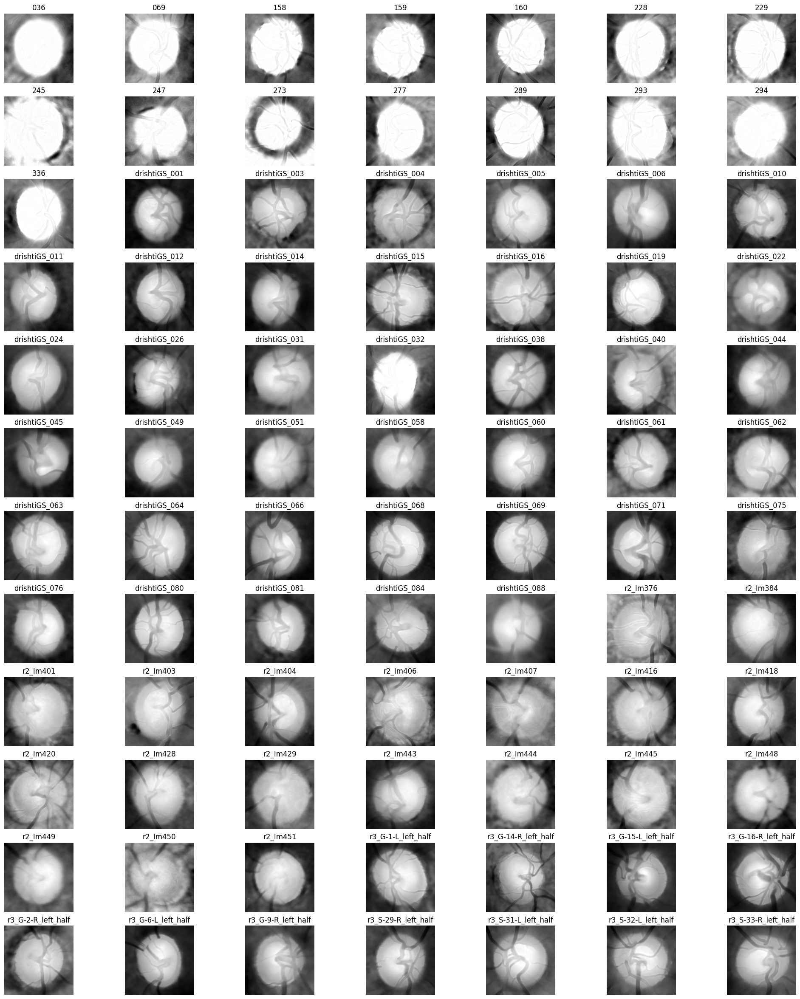

In [43]:
display_all_with(pre, 0, (12,7), (25,30))

In [44]:
def remove_vessels(imgs):
    # p = {}
    no_vsl = {}
    clahe = cv2.createCLAHE(5.0, (16,16))
    sharpen_kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
    for img in imgs:
        g = imgs[img][:,:,1].copy()
        g_sharp = cv2.filter2D(src=g, ddepth=-1, kernel=sharpen_kernel)
        g_inv = 255-g_sharp
        clahed = clahe.apply(g_inv)
        g_gamma = adjust_gamma(clahed, 5)
        g_gauss = cv2.GaussianBlur(g_gamma, (17,17),0)
        ret, th = cv2.threshold(g_gauss,0,255,
                                cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        no_vsl[img] = cv2.inpaint(imgs[img].copy(), th, 10,cv2.INPAINT_TELEA)
    # display_all(p, (12, 7), (25, 30), use_gray=True)
    return no_vsl


In [45]:
no_vsl = remove_vessels(pre)

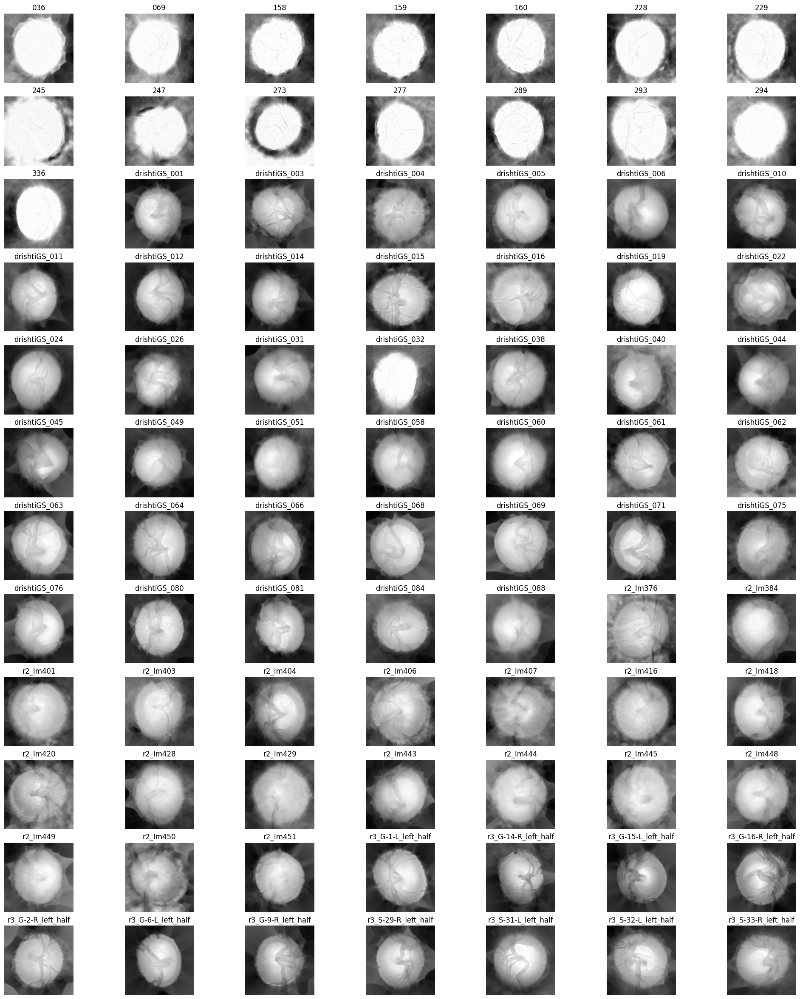

In [46]:
display_all_with(no_vsl, 0, (12, 7), (25,30))

In [47]:
# tidak harus ada draw line
def draw_roi_line(imgs, roi_line, color):
    odlines = {}
    for img in imgs:
        odlines[img] = cv2.ellipse(imgs[img], 
                                   roi_line[img], 
                                   color, 
                                   1, 
                                   cv2.LINE_AA)
    return odlines

def get_which_ellipse(contours):
    conts = np.array([contour.shape[0] for contour in contours])
    cont_idx = np.argmax(conts)
    ellipse = cv2.fitEllipse(contours[cont_idx])
    return ellipse

def get_circle(contours):
    conts = np.array([contour.shape[0] for contour in contours])
    cont_idx = np.argmax(conts)
    (x,y), radius = cv2.minEnclosingCircle(contours[cont_idx])
    return (x,y), radius

def extract_od(imgs):
    p = {}
    drawn_roi = {}
    ods = {}
    clahe = cv2.createCLAHE(3, (8,8))
    okernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
    
    for img in imgs:
        # OD SEGMENTATION=====================
        red = imgs[img][:,:,0]
        gmcr = adjust_gamma(red, 2.5)
        gmclahe = adjust_gamma(gmcr, 1.5)
        gmcr_bl = cv2.GaussianBlur(gmclahe, (25,25), 0)
        # p[img] = cv2.erode(gmcr_bl.copy(), kernel=np.ones((7,7), np.uint8))
        opened = cv2.morphologyEx(gmcr_bl, cv2.MORPH_OPEN, kernel=okernel)
        # erode = cv2.erode(opened, kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15,15)))
        ret2, th2 = cv2.threshold(opened,0,255,
                                  cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        binaries = cv2.erode(th2, kernel=cv2.getStructuringElement(cv2.MORPH_RECT, (15,15)))
        
        # DRAWING CONTOURS======================
        cont, hcy = cv2.findContours(binaries, 
                                     cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        # ellipse = get_which_ellipse(cont)
        (x,y),radius = get_circle(cont)
        center = (int(x),int(y))
        radius = int(radius)
        drawn_roi[img] = cv2.circle(imgs[img],center,radius,(0,255,0), 2)
        od = np.zeros_like(th2, dtype='uint8')
        od = cv2.circle(od, center, radius, (255, 255, 255), -1)
        ods[img] = od
    # display_all(p, (12,7), (25,30), True)
    return drawn_roi, ods
        

In [48]:
od_line, all_od = extract_od(no_vsl)

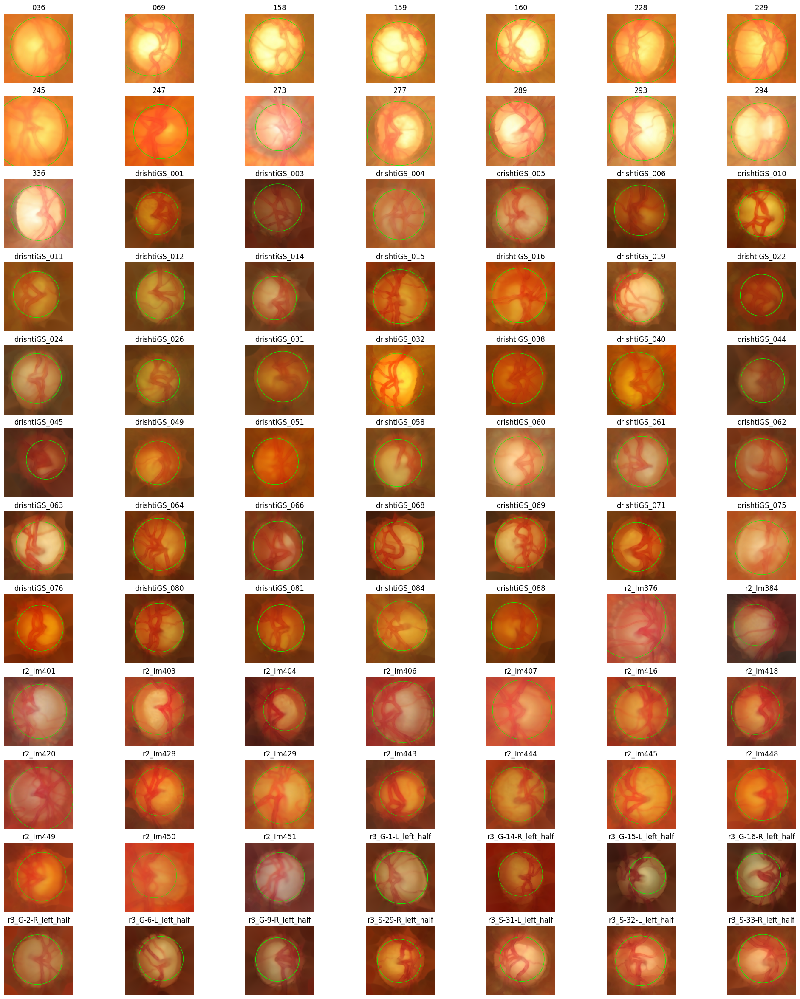

In [49]:
display_all(od_line, (12,7), (25,30), True)

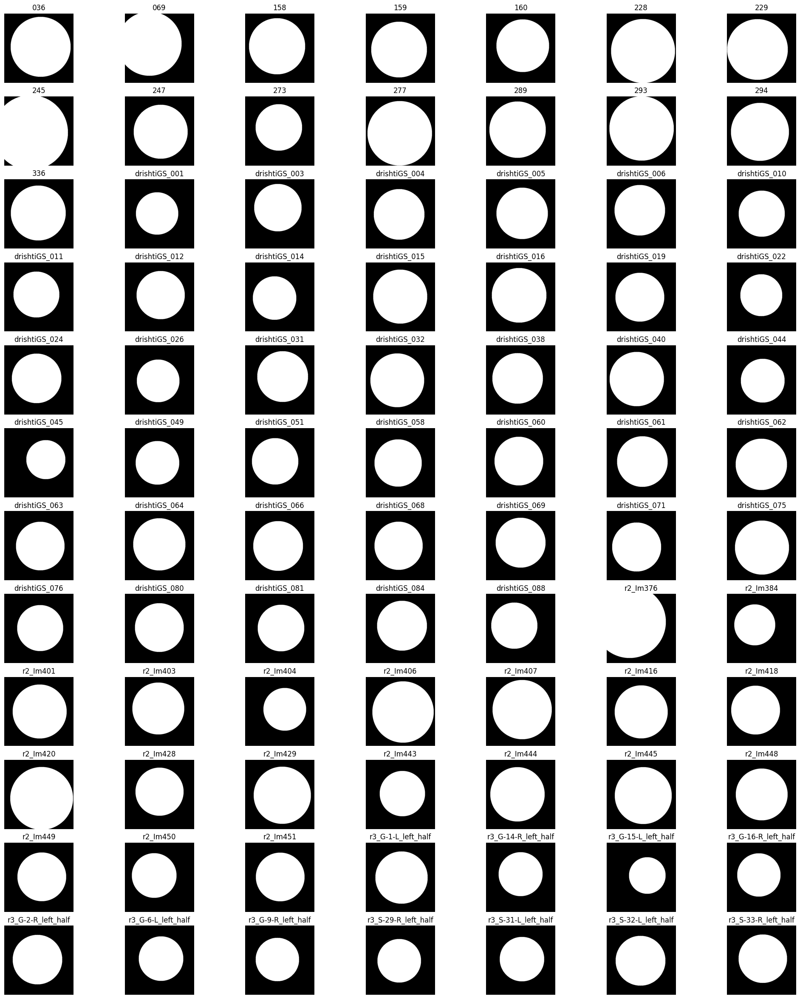

In [50]:
display_all(all_od, (12,7), (25,30), True)

In [90]:
def extract_oc(imgs):
    p = {}
    for img in imgs:
        p[img] = cv2.cvtColor(imgs[img], cv2.COLOR_RGB2)
    display_all_with(p, 1, (12,7), (25,30))
    return None, None

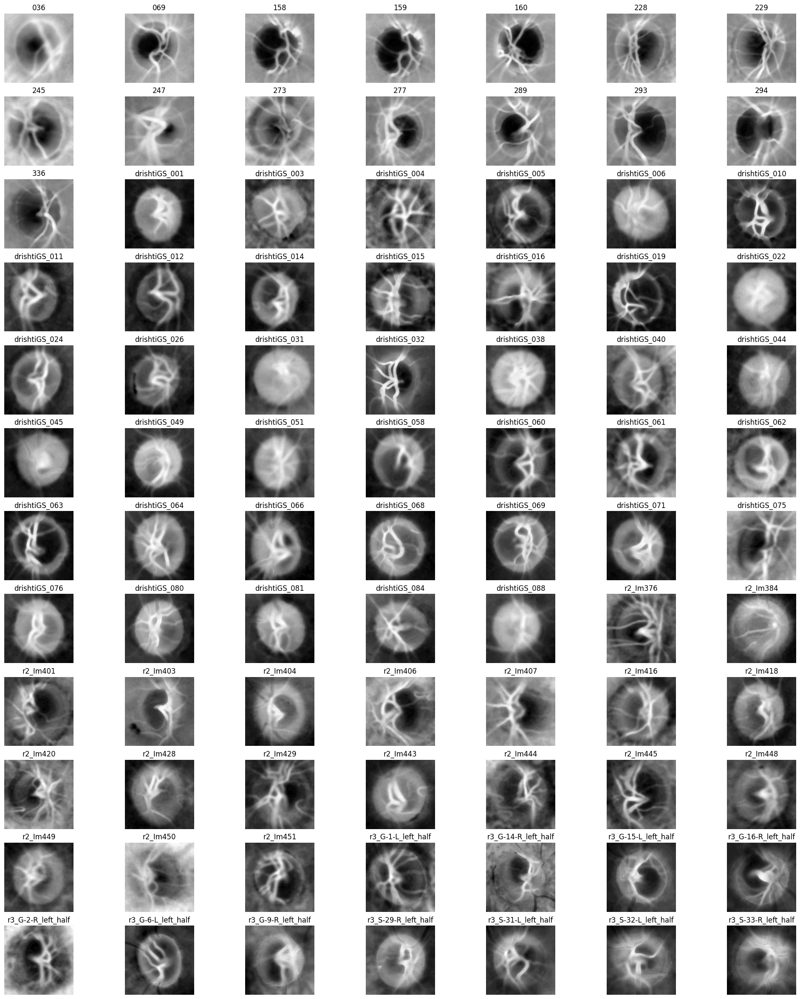

In [91]:
oc_line, all_oc = extract_oc(pre)